# Tokens

In [1]:
#Initial Imports
import os
import pandas as pd

In [2]:
from dotenv import load_dotenv
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# from vaderSentiment import SentimentIntensityAnalyzer
from pathlib import Path
analyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\annmi\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [3]:
load_dotenv()
%matplotlib inline

In [61]:
#Import Data from .CSV files
csv_path = aapl_file = Path('../Web-Scraping-APP/AAPL_HEADLINES.csv')

In [62]:
aapl_headlines = pd.read_csv(csv_path)
aapl_headlines.head()

,Headline,Date
0,"Apple Inc. stock falls Monday, underperforms m...","Nov. 9, 2020 at 4:30 p.m. ET"
1,Big Tech Stocks Are Lagging Today. Why They’ll...,"Nov. 9, 2020 at 1:45 p.m. ET"
2,"As Apple releases its new line of Macs, the bi...","Nov. 9, 2020 at 1:18 p.m. ET"
3,"In the Midst of Election Uncertainty, Younger ...","Nov. 6, 2020 at 9:21 p.m. ET"
4,Berkshire Buybacks Hit Record $9 Billion in Th...,"Nov. 7, 2020 at 8:49 a.m. ET"


In [63]:
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from string import punctuation
import re

In [64]:
# Expand the default stopwords list if necessary
sw_addons={'char', 'colleague', 'day', 'another', 'edition', 'writes', 'whats','going', ',','s'}

In [65]:
lemmatizer=WordNetLemmatizer()

def tokenizer(text):
    # Create a list of the words
    words=word_tokenize(text)
    # Remove the stop words
    sw = set(stopwords.words('english')).union(set(punctuation)).union(sw_addons)
    # Lemmatize Words into root words
    lem = [lemmatizer.lemmatize(word) for word in words]
    # Convert the words to lowercase
    tokens = [word.lower() for word in lem if word.lower() not in sw]
    return tokens

In [66]:
def add_tokens(df):
    df['Tokens']=df['Headline'].apply(tokenizer)
    df=df.reset_index()
    df=df.set_index('Date', inplace=True)
    return df


In [67]:
add_tokens(aapl_headlines)
aapl_headlines.head()

,Headline,Date,Tokens
0,"Apple Inc. stock falls Monday, underperforms m...","Nov. 9, 2020 at 4:30 p.m. ET","[apple, inc., stock, fall, monday, underperfor..."
1,Big Tech Stocks Are Lagging Today. Why They’ll...,"Nov. 9, 2020 at 1:45 p.m. ET","[big, tech, stocks, lagging, today, ’, fine, l..."
2,"As Apple releases its new line of Macs, the bi...","Nov. 9, 2020 at 1:18 p.m. ET","[apple, release, new, line, macs, biggest, ben..."
3,"In the Midst of Election Uncertainty, Younger ...","Nov. 6, 2020 at 9:21 p.m. ET","[midst, election, uncertainty, younger, trader..."
4,Berkshire Buybacks Hit Record $9 Billion in Th...,"Nov. 7, 2020 at 8:49 a.m. ET","[berkshire, buybacks, hit, record, 9, billion,..."


# Most Frequent Tokens

In [68]:
#Initial Imports
from collections import Counter

In [69]:
#Create the Tokenizer Function
def token_count(df, N=10):
    """Returns the top N tokens from the frequency count"""
    big_string=df["Headline"].str.cat()
    df_tokenized=tokenizer(big_string)
    return Counter(df_tokenized).most_common(N)

In [70]:
token_count(aapl_headlines)

[('’', 3477),
 ('stock', 2789),
 ('apple', 1561),
 ("'s", 1023),
 ('market', 762),
 ('‘', 743),
 ('dow', 624),
 ('tech', 564),
 ('iphone', 548),
 ('new', 460)]

In [71]:
#Function if there are different column titles
def token_count(text_column, N=10):
    """Returns the top N tokens from the frequency count"""
    big_string=text_column.str.cat()
    df_tokenized=tokenizer(big_string)
    return Counter(df_tokenized).most_common(N)

token_count(aapl_headlines['Headline'])

[('’', 3477),
 ('stock', 2789),
 ('apple', 1561),
 ("'s", 1023),
 ('market', 762),
 ('‘', 743),
 ('dow', 624),
 ('tech', 564),
 ('iphone', 548),
 ('new', 460)]

# Word Clouds

In [72]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

In [73]:
#Create WC function
def word_cloud(df):
    big_string=df['Headline'].str.cat()
    df_tokenized=tokenizer(big_string)
    wc_string=' '.join(df_tokenized)
    nlp_wc = WordCloud(width=1200, height=800, max_words=50).generate(wc_string)
    return plt.imshow(nlp_wc)

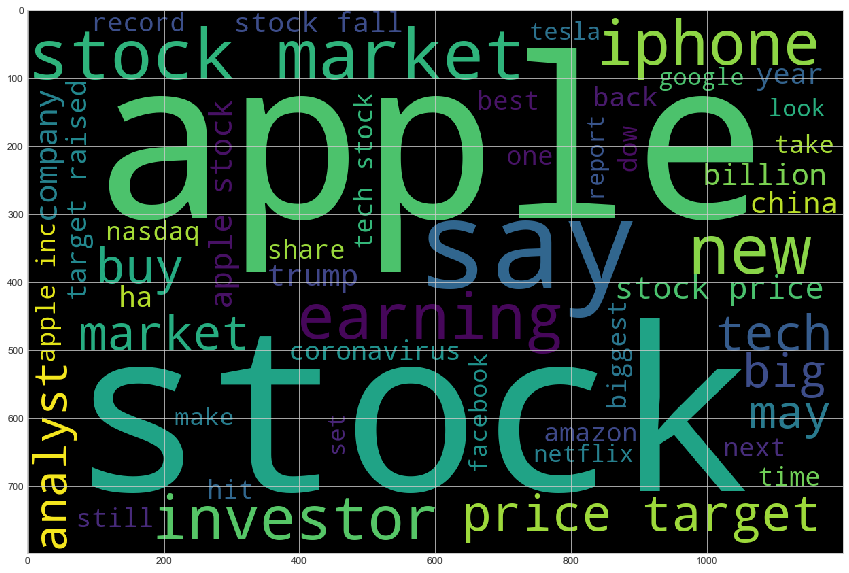

In [74]:
word_cloud(aapl_headlines)

In [75]:
# WC function for different column titles
def word_cloud(text_column):
    big_string=text_column.str.cat()
    df_tokenized=tokenizer(big_string)
    wc_string=' '.join(df_tokenized)
    nlp_wc = WordCloud(width=1200, height=800, max_words=50).generate(wc_string)
    return plt.imshow(nlp_wc)

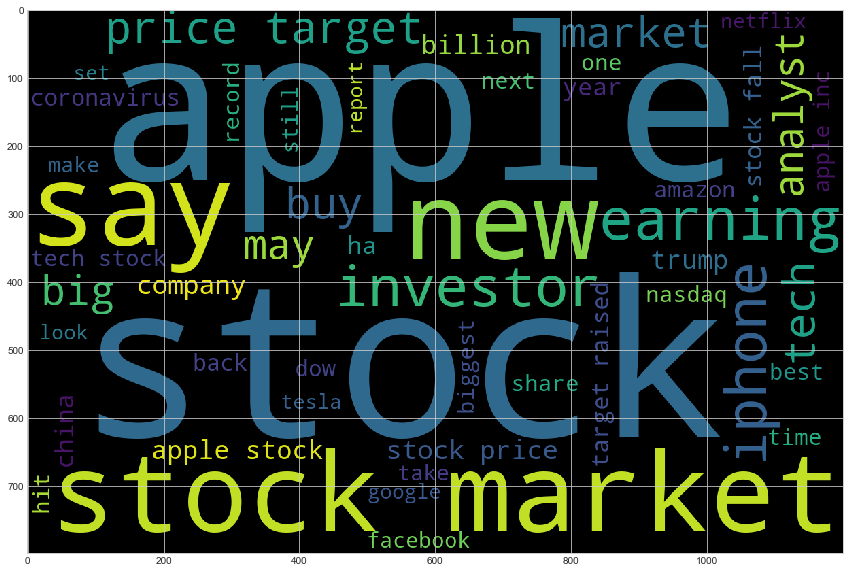

In [76]:
word_cloud(aapl_headlines['Headline'])

# NER

In [79]:
#Imports
import spacy
from spacy import displacy

In [80]:
# Create NER function
def named_entity_recognition(df):
    '''Load the spaCy model'''
    nlp = spacy.load('en_core_web_sm')
    '''Create a big string'''
    big_string=df['Headline'].str.cat()
    '''Run Processor'''
    processed_doc=nlp(big_string)
    '''Add Title'''
    processed_doc.user_data['title']='Named Entity Recognition'
    '''Render the visualization'''
    return displacy.render(processed_doc, style='ent')

In [81]:
named_entity_recognition(aapl_headlines)

In [82]:
#Create NER function for column titles
def named_entity_recognition(text_column):
    '''Load the spaCy model'''
    nlp = spacy.load('en_core_web_sm')
    '''Create a big string'''
    big_string=text_column.str.cat()
    '''Run Processor'''
    processed_doc=nlp(big_string)
    '''Add Title'''
    processed_doc.user_data['title']='Named Entity Recognition'
    '''Render the visualization'''
    return displacy.render(processed_doc, style='ent')

In [83]:
named_entity_recognition(aapl_headlines['Headline'])